In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import astropy.units as u
import astropy.constants as const
from astropy.table import Table, vstack, join
from astropy.coordinates import SkyCoord

import gala
from gala import coordinates as gc

import galstreams
import sys
sys.path.append('/Users/Tavangar/Work/CATS_Workshop/cats/')
# import cats
from cats.pawprint.pawprint import Pawprint, Footprint2D
from cats.CMD import Isochrone
from cats.inputs import stream_inputs as inputs
from cats.proper_motions import ProperMotionSelection, rough_pm_poly

import importlib

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
gaia_cols = ['source_id', 'ra', 'dec', 'parallax', 'parallax_error',
        'pmra', 'pmra_error', 'pmdec', 'pmdec_error',
        'radial_velocity', 'radial_velocity_error',
        'r_med_photogeo', 'r_lo_photogeo','r_hi_photogeo',
        'phot_g_mean_mag', 'phot_bp_mean_mag', 'phot_rp_mean_mag']
ps1_cols = ['source_id', 'gMeanPSFMag', 'rMeanPSFMag',
            'iMeanPSFMag', 'zMeanPSFMag', 'yMeanPSFMag']

In [3]:
ps1_xm = pd.read_csv('/Users/Tavangar/Work/CATS_Workshop/cats/data/m92/M92_DR3_PS1_xm.csv', usecols=ps1_cols)
ps1_xm

,source_id,gMeanPSFMag,rMeanPSFMag,iMeanPSFMag,zMeanPSFMag,yMeanPSFMag
0,1348939551389226752,20.372499,19.952999,19.801100,19.775000,19.749599
1,1348939688828172416,22.009501,21.043501,19.729601,19.123899,18.910500
2,1348939727483134336,21.607100,20.592501,19.511900,19.007000,18.805799
3,1348938967273665408,21.325399,20.058701,19.009600,18.547100,18.306999
4,1348938967273668864,20.087601,19.781900,19.687500,19.675400,19.580400
...,...,...,...,...,...,...
5726088,1436951540183017344,21.788099,20.599501,19.538601,19.021099,18.738501
5726089,1431738274519208320,19.780001,19.081600,18.807600,18.673201,18.639099
5726090,1431738102720517248,21.340599,20.313900,19.934500,19.751600,19.513599
5726091,1431758203167470592,17.974501,17.565599,17.421101,17.392000,17.357901


In [4]:
ps1_xm.columns

Index(['source_id', 'gMeanPSFMag', 'rMeanPSFMag', 'iMeanPSFMag', 'zMeanPSFMag',
       'yMeanPSFMag'],
      dtype='object')

In [5]:
t = pd.read_csv('/Users/Tavangar/Work/CATS_Workshop/cats/data/m92/m92_window.csv', usecols=gaia_cols)
# t.set_index('source_id')

In [6]:
cmd_tbl = pd.read_csv('/Users/Tavangar/Work/CATS_Workshop/cats/data/m92/m92_window_cmd_filter.csv', usecols=['source_id', 'phot_g_mean_mag0', 'phot_bp_mean_mag0', 'phot_rp_mean_mag0'])
# cmd_tbl.set_index('source_id')

In [7]:
just_ids = pd.read_csv('/Users/Tavangar/Work/CATS_Workshop/cats/data/m92/m92_window_cmd_filter.csv', usecols=['source_id'])

In [8]:
# Table.from_pandas(just_ids).write('/Users/Tavangar/Work/CATS_Workshop/cats/data/m92/m92_filter_ids.fits', overwrite=True)

In [9]:
# extinct = pd.read_csv('/Users/Tavangar/Work/CATS_Workshop/cats/data/m92/m92-extinction.csv', usecols=['source_id', 'ag_gspphot', 'ebpminrp_gspphot'])
# extinct

In [10]:
gaia_tbl = t.merge(cmd_tbl)
#gaia_tbl_ext = gaia_tbl.merge(extinct)
tbl_ = gaia_tbl.merge(ps1_xm)
tbl = Table.from_pandas(tbl_)

In [11]:
from pyia import GaiaData
from dustmaps.sfd import SFDQuery
from dustmaps.config import config
config['data_dir'] = '/Users/Tavangar/Work/CATS_Workshop/cats/data/'

g = GaiaData(tbl)

coeffs = {
    'g': 1.16529*2.742,
    'r': 0.86813*2.742, 
    'i': 0.67659*2.742, 
    # 'z': 1.322, 
    # 'y': 1.087
}

ebv = g.get_ebv(dustmaps_cls=SFDQuery)
Avals = {k: coeffs[k] * ebv for k in coeffs}

for k in coeffs:
    g.data[f'{k}_0'] = g[f'{k}MeanPSFMag'] - Avals[k]

In [12]:
tbl = g.data
tbl

source_id,ra,dec,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,phot_g_mean_mag,phot_bp_mean_mag,phot_rp_mean_mag,radial_velocity,radial_velocity_error,r_med_photogeo,r_lo_photogeo,r_hi_photogeo,phot_bp_mean_mag0,phot_rp_mean_mag0,phot_g_mean_mag0,gMeanPSFMag,rMeanPSFMag,iMeanPSFMag,zMeanPSFMag,yMeanPSFMag,g_0,r_0,i_0
int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
1308558376248592384,256.8783118510876,29.077134736072487,0.2506188976038783,0.08587359,-1.938190779180175,0.08487491,-6.4215367097461,0.085248075,17.985447,18.390842,17.428885,--,--,3493.3352,2957.0908,4056.4502,18.1220909846634,17.265227186719297,17.76952271953534,18.4256000518799,17.9594993591309,17.7763004302979,17.7264995574951,17.6655006408691,18.16299909353258,17.763864144682923,17.62382921576505
1308558444968069632,256.8608233595479,29.093459686115214,1.1557385734250931,0.47060823,-1.9756805881207695,0.48051944,-14.03153515378818,0.48376867,20.339647,21.03238,19.381264,--,--,3260.6633,2641.1963,3846.8005,20.773061496121468,19.220799588837444,20.142252277209774,21.6511001586914,20.487699508667,19.7126998901367,19.347900390625,19.1558990478516,21.384878695011132,20.289367035031326,19.55812653899191
1308559162225651328,256.84699600733336,29.09091692320733,0.4583682054174116,0.13872221,-8.653292830287947,0.13240854,-0.8731335407273323,0.13883987,18.7406,19.352497,18.020565,--,--,2443.8513,2129.8835,2828.1262,19.08634886151853,17.85606182584194,18.532203370970056,19.5629997253418,18.7092990875244,18.3505001068115,18.2075996398926,18.1196002960205,19.294797331094745,18.50949083268641,18.1947765946388
1308559196585395968,256.8465578472884,29.102487415044703,0.8214754735106841,0.18202274,-5.268999000369176,0.17009687,-7.9192741230575905,0.18279812,19.1746,20.385412,18.069387,--,--,999.4911,888.0702,1132.0354,20.12335017396373,17.916058278888478,18.992851697503696,20.8477993011475,19.576000213623,18.4874992370605,17.9766998291016,17.7322006225586,20.579722970724145,19.376285895705177,18.331848919391586
1308559200882313856,256.8429226525285,29.10269982514224,2.0555770636795985,0.40106097,-32.883751233275085,0.44707474,37.64964662583849,0.3870562,20.1755,21.276903,18.971567,--,--,866.5648,650.9118,1172.9371,21.01460899472796,18.817841133179986,19.99323279688557,21.9922008514404,20.9701995849609,19.425199508667,18.7203998565674,18.3759994506836,21.723713219165774,20.770178824663123,19.26931037008763
1308559235242052352,256.8363847241979,29.09829529680565,0.4586000765943431,0.022734482,-1.490979691614105,0.02335512,-0.1008583693390315,0.02334617,15.439302,15.852363,14.859213,--,--,2057.1426,1981.6317,2157.8918,15.57757544197997,14.69159960668302,15.21899107531477,15.9282999038696,15.4160995483398,15.2206001281738,15.1572999954224,15.1066999435425,15.65901315212247,15.215483471751169,15.064247012138338
1308559269601790848,256.83808441912777,29.102991091887805,-0.1580941461919409,0.5321563,-1.643660346095611,0.53637254,-6.44725026044421,0.564133,20.379892,21.126398,19.621593,--,--,4191.7734,3510.8271,4991.831,20.862448215794327,19.45806781470317,20.1761638286938,21.4489994049072,20.3729000091553,19.8745002746582,19.6756992340088,19.3957996368408,21.17999073863027,20.172491103410746,19.718308612704273
1308559437103566848,256.823698955938,29.108356946854407,-0.1990618561371088,0.20775706,-1.3123165782530486,0.19669898,-6.430637859838188,0.2065399,19.377356,19.81928,18.904432,--,--,7636.416,6014.771,9983.181,19.54156882377513,18.73574282287472,19.15359287302396,19.7108001708984,19.3927001953125,19.2273998260498,19.1539001464844,19.2458000183105,19.440582633018455,19.191390678286552,19.07050627470016
1308559437103567360,256.81727563925386,29.11014653649031,0.6947111895517901,0.20860139,-3.705772865473095,0.20418157,0.132311653221258,0.2070395,19.376144,19.947454,18.759071,--,--,3653.3508,3042.538

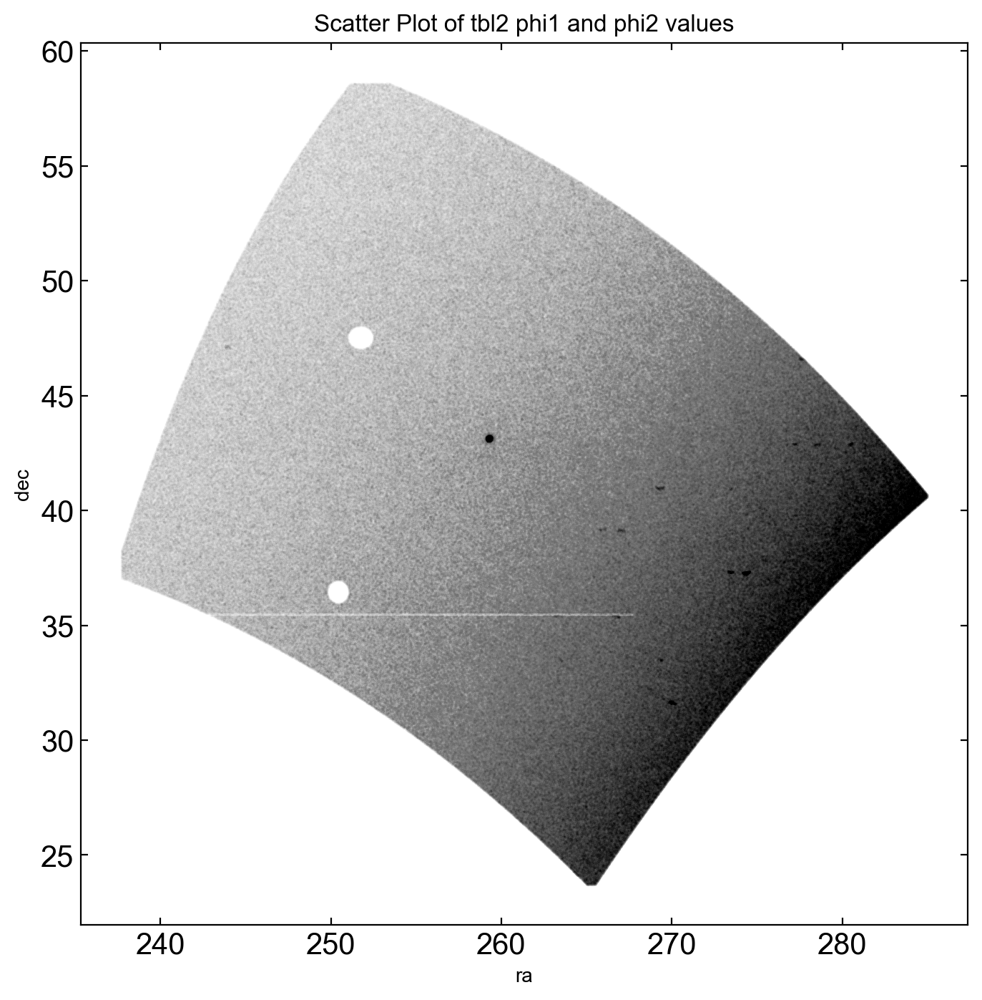

In [13]:
plt.figure(figsize=(8,8))
plt.scatter(tbl['ra'], tbl['dec'], s=0.00001, c='black')
# plt.scatter(tbl3['phi1'], tbl3['phi2'], s=0.1, c='r')
plt.xlabel('ra')
plt.ylabel('dec')
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.show()

In [14]:
importlib.reload(sys.modules['cats.CMD'])
importlib.reload(sys.modules['cats.pawprint.pawprint'])
importlib.reload(sys.modules['cats.inputs'])
from cats.pawprint.pawprint import Pawprint, Footprint2D
from cats.CMD import Isochrone
from cats.inputs import stream_inputs as inputs

In [15]:
stream = 'M92'
p = Pawprint.pawprint_from_galstreams(inputs[stream]['short_name'],
                                      'ibata2021',#inputs[stream]['pawprint_id'],
                                      width=inputs[stream]['width'] * u.deg,
                                      phi1_lim = [-9.5,9.2])

m92_icrs = SkyCoord(ra = tbl['ra']*u.deg, dec = tbl['dec']*u.deg,
                   pm_ra_cosdec=tbl['pmra']*u.mas/u.yr, pm_dec=tbl['pmdec']*u.mas/u.yr,)
m92 = m92_icrs.transform_to(p.stream_frame)

Modifying/extrapolating galstreams track
Modifying/extrapolating galstreams track


In [16]:
tbl['phi1'] = m92.phi1.value
tbl['phi2'] = m92.phi2.value
tbl['pm_phi1_cosphi2_unrefl'] = m92.pm_phi1_cosphi2.value
tbl['pm_phi2_unrefl'] = m92.pm_phi2.value

## Generate a Query to get the PS1 Data

In [122]:
import pathlib
data_path = pathlib.Path('/Users/Tavangar/Work/CATS_Workshop/cats/data/m92/').resolve().absolute()
data_path

PosixPath('/Users/Tavangar/Work/CATS_Workshop/cats/data/m92')

In [123]:
idx = np.linspace(0, len(tbl), 4).astype(int)
idx

array([      0, 1817894, 3635788, 5453683])

In [131]:
reduced_tbl = tbl['source_id', 'ra', 'dec']
path = data_path / 'tmp'
path.mkdir(exist_ok=True)

idx = np.linspace(0, len(tbl), 6).astype(int)
for j, (i1, i2) in enumerate(zip(idx[:-1], idx[1:])):
    reduced_tbl[i1:i2].write(
        path / f'm92_all_mast_upload{j}.csv', 
        overwrite=True,
        format='ascii.csv'
    )

Run a query in MAST with:

```
select s.source_id, s.ra, s.dec, o.objID, o.raMean, o.decMean,
   o.nDetections, o.ng, o.nr, o.ni, o.nz, o.ny,
   m.gMeanPSFMag, m.rMeanPSFMag, m.iMeanPSFMag, m.zMeanPSFMag, m.yMeanPSFMag,
   m.gMeanPSFMagErr, m.rMeanPSFMagErr, m.iMeanPSFMagErr, m.zMeanPSFMagErr, m.yMeanPSFMagErr
into mydb.M92_DR3_xm_PS_Gaia 
from MyDB.M92_Gaia_DR3 s
cross apply GetNearbyObjEq(s.ra, s.dec, 3.0 / 60.0) nb
inner join ObjectThin o on o.objid=nb.objid and o.nDetections>3
inner join MeanObject m on o.objid=m.objid and o.uniquePspsOBid=m.uniquePspsOBid
```

## Continue Analysis

In [17]:
subtbl = tbl[(np.abs(tbl['phi1']) < 15) & (np.abs(tbl['phi2']) < 10) & \
             (np.abs(tbl['pmra']) < 100) & \
             (np.abs(tbl['phot_g_mean_mag0']) < 100) &  (np.abs(tbl['phot_bp_mean_mag0']) < 100) &  (np.abs(tbl['phot_rp_mean_mag0']) < 100)]

In [18]:
subtbl.write("../../CATS_Workshop/cats/data/joined-M92.fits", overwrite=True)

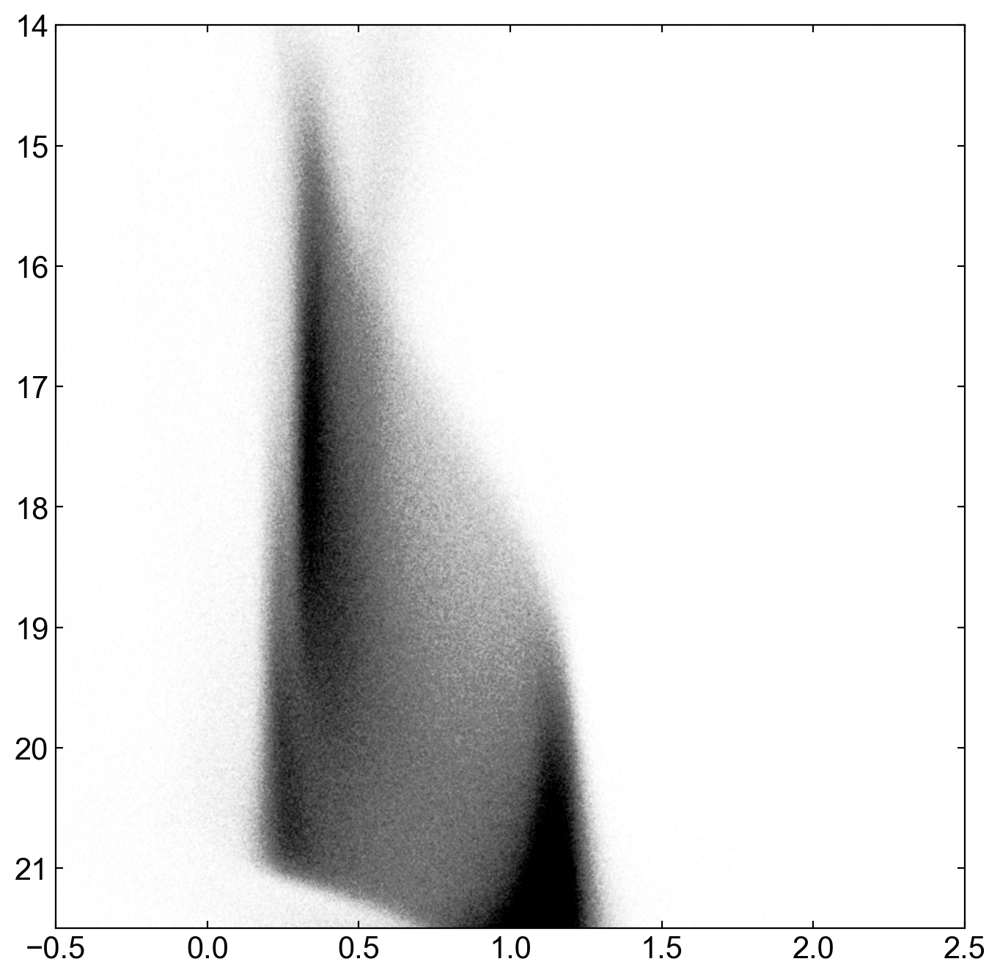

In [65]:
plt.figure(figsize=(8,8))
plt.scatter(subtbl['g_0'] - subtbl['r_0'], subtbl['g_0'], s=0.00001, c='black')
plt.xlim(-0.5,2.5) ; plt.ylim(21.5,14)
# plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.show()

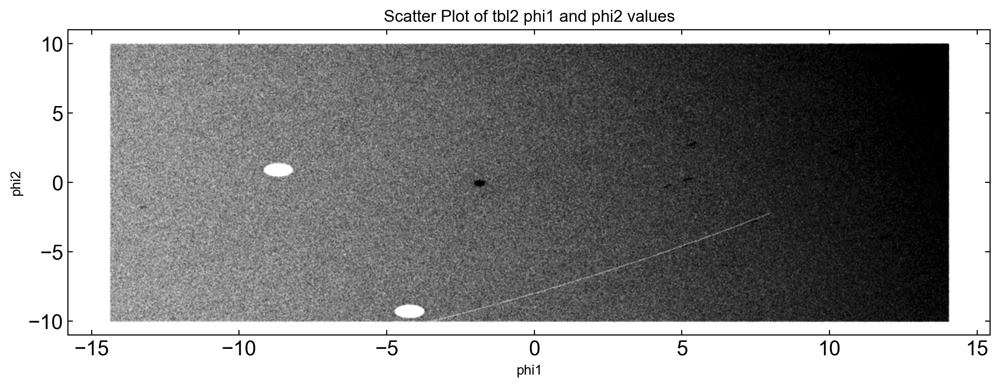

In [66]:
plt.figure(figsize=(12,4))
plt.scatter(subtbl['phi1'], subtbl['phi2'], s=0.0001, c='black')
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.show()

In [67]:
import astropy.table as at

In [137]:
importlib.reload(sys.modules['cats.CMD'])
importlib.reload(sys.modules['cats.pawprint.pawprint'])
importlib.reload(sys.modules['cats.inputs'])
from cats.pawprint.pawprint import Pawprint, Footprint2D
from cats.CMD import Isochrone
from cats.inputs import stream_inputs as inputs

In [138]:
stream = 'M92'

p = Pawprint.pawprint_from_galstreams(inputs[stream]['short_name'],
                                      'ibata2021',#inputs[stream]['pawprint_id'],
                                      width=inputs[stream]['width'] * u.deg,
                                      phi1_lim = [-9.5,9.2])

cat = subtbl

# rough pm cut to start with (this comes only from the galstreams proper motion tracks)
p.pmprint, pm_mask = rough_pm_poly(p, cat, buffer=2)

# Create the CMD cuts
o = Isochrone(stream, cat, pawprint=p)
_, iso_mask, _, hb_mask, pprint = o.simpleSln(maxmag=22, mass_thresh=1)

Modifying/extrapolating galstreams track
Modifying/extrapolating galstreams track


In [139]:
inputs[stream]['feh']

-1.98

### I need extinction corrected CMD in this case, which I do not have yet

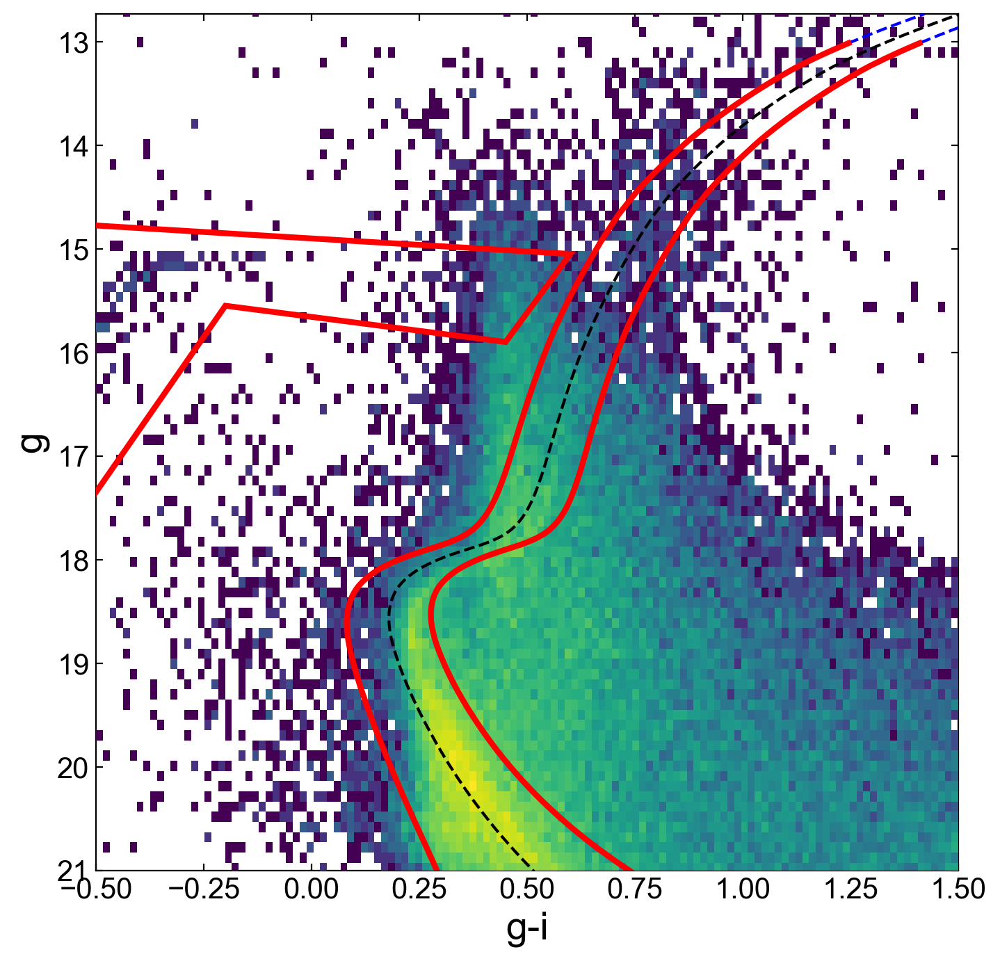

In [140]:
%matplotlib inline
fig = o.plot_CMD(scale_err=2)

In [141]:
importlib.reload(sys.modules['cats.proper_motions'])
importlib.reload(sys.modules['cats.pawprint.pawprint'])
from cats.pawprint.pawprint import Pawprint, Footprint2D
from cats.proper_motions import ProperMotionSelection

pmsel = ProperMotionSelection(stream, cat, pprint,
                              n_dispersion_phi1=3, n_dispersion_phi2=3, cutoff=0.1)

-0.17116191762005428
Fitting for peak pm location
Pre-fitting mean PM values: -3.709, -3.152
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Post-fitting (pm1_mean, pm2_mean, pm1_std, pm2_std): [-3.8538378204941974, -3.168667420905718, 0.2963491869416763, 0.2721139485960307] 

Producing the polygon and mask


In [142]:
o = Isochrone(stream, cat, pawprint=pmsel.pawprint,)

_, iso_mask, _, hb_mask, pprint = o.simpleSln(22, mass_thresh=1)

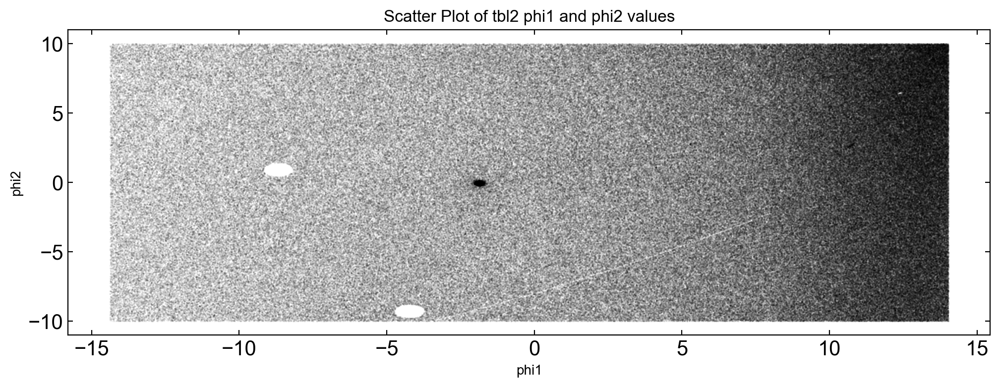

In [143]:
plt.figure(figsize=(12,4))
plt.scatter(subtbl[iso_mask]['phi1'], subtbl[iso_mask]['phi2'], s=0.001, c='black')
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.show()

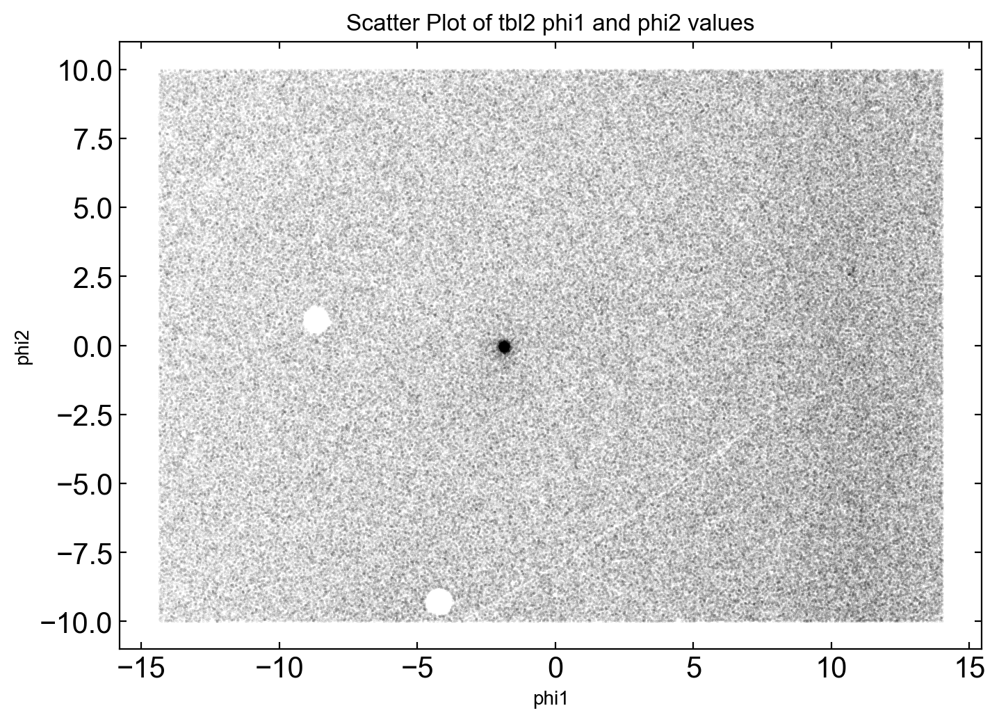

In [144]:
plt.figure(figsize=(8,8))
plt.scatter(subtbl[iso_mask&pm_mask]['phi1'], subtbl[iso_mask&pm_mask]['phi2'], s=0.001, c='black')
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.gca().set_aspect('equal')
plt.show()

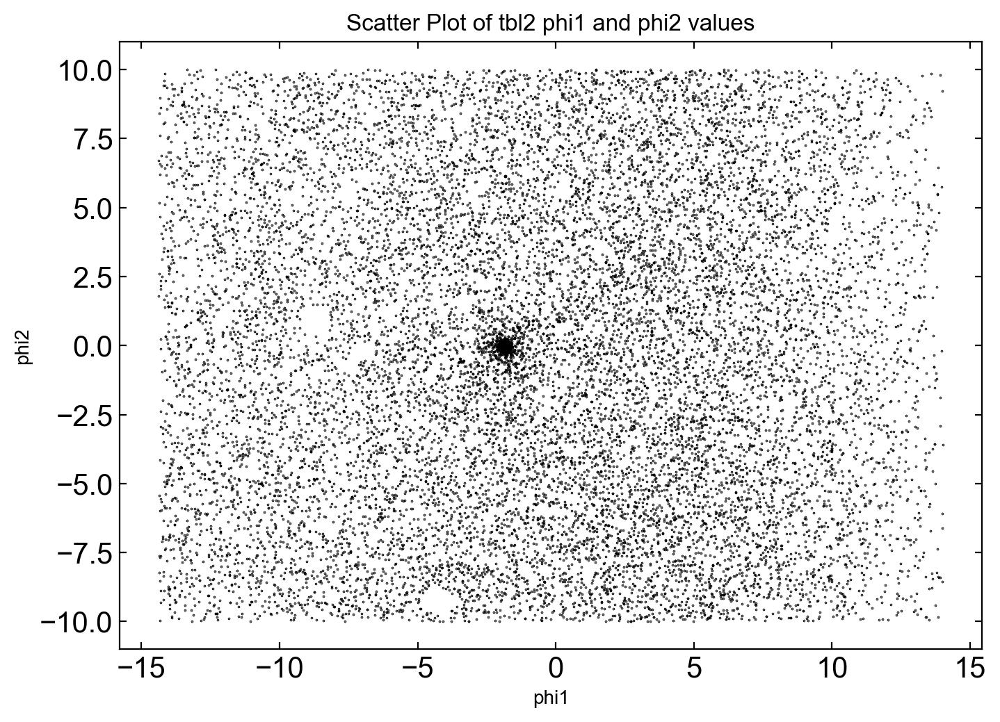

In [145]:
plt.figure(figsize=(8,8))
plt.scatter(subtbl[pmsel.pm12_mask]['phi1'], subtbl[pmsel.pm12_mask]['phi2'], s=0.1, c='black')
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.gca().set_aspect('equal')
plt.show()

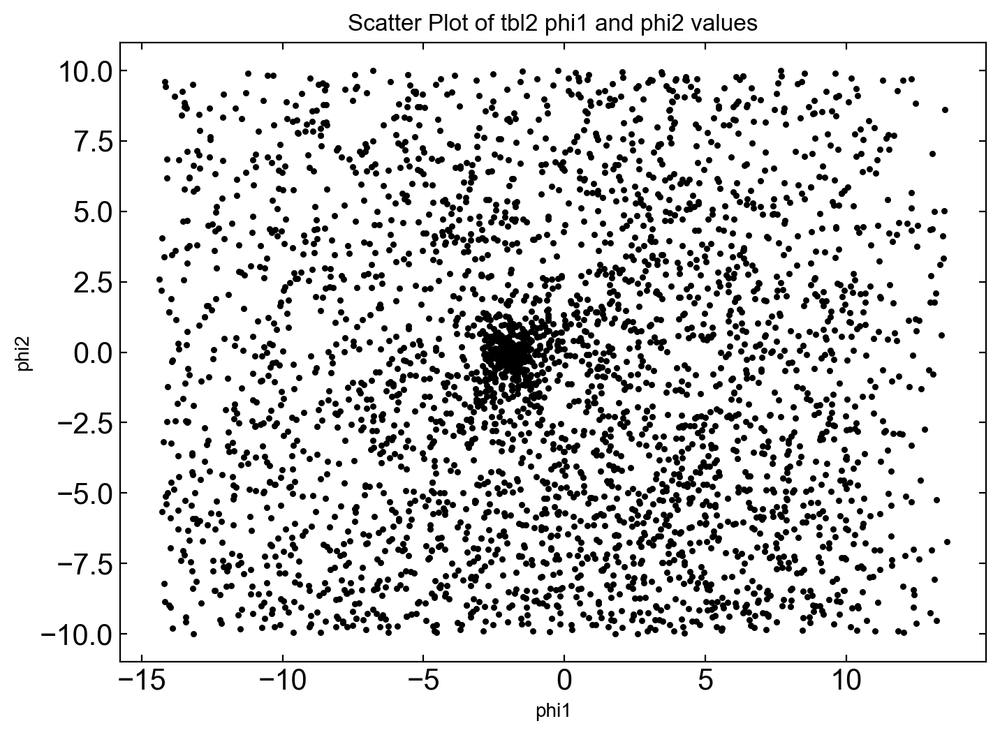

In [146]:
plt.figure(figsize=(8,8))
plt.scatter(subtbl[iso_mask&pmsel.pm12_mask]['phi1'], subtbl[iso_mask&pmsel.pm12_mask]['phi2'], s=5, c='black')
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.gca().set_aspect('equal')
plt.show()

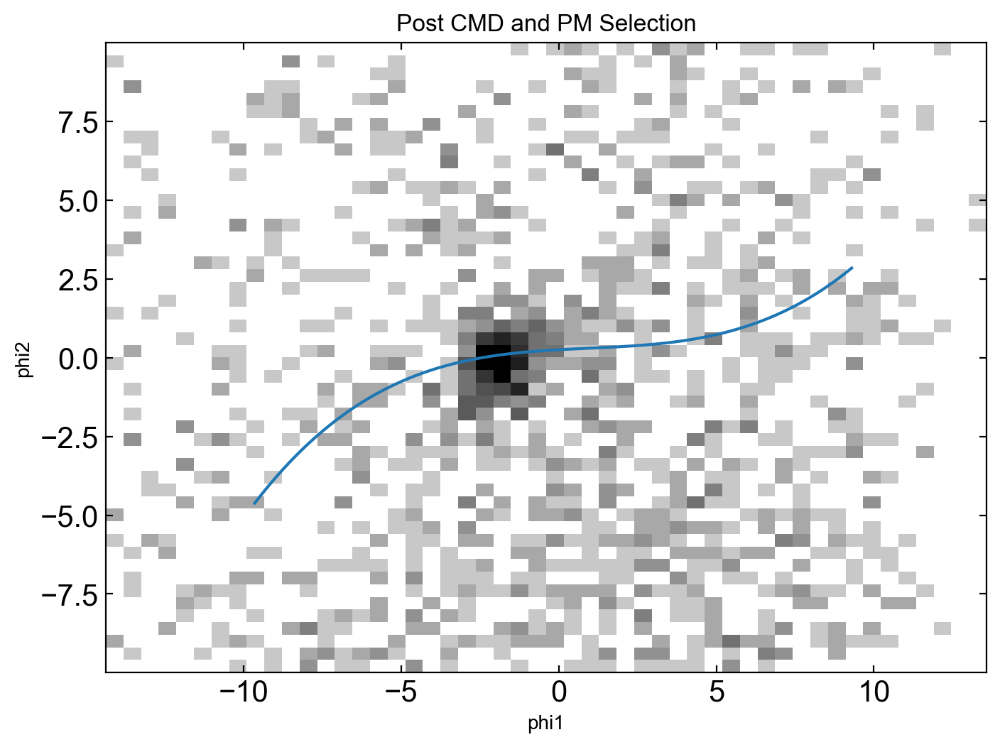

In [147]:
plt.figure(figsize=(8,8))
plt.hist2d(subtbl[iso_mask&pmsel.pm12_mask]['phi1'], subtbl[iso_mask&pmsel.pm12_mask]['phi2'], 
           bins=50, norm=mpl.colors.LogNorm(vmax=25), cmap='gray_r')
plt.plot(p.track.track.transform_to(p.stream_frame).phi1, p.track.track.transform_to(p.stream_frame).phi2)
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.gca().set_aspect('equal')
plt.title('Post CMD and PM Selection')
plt.show()

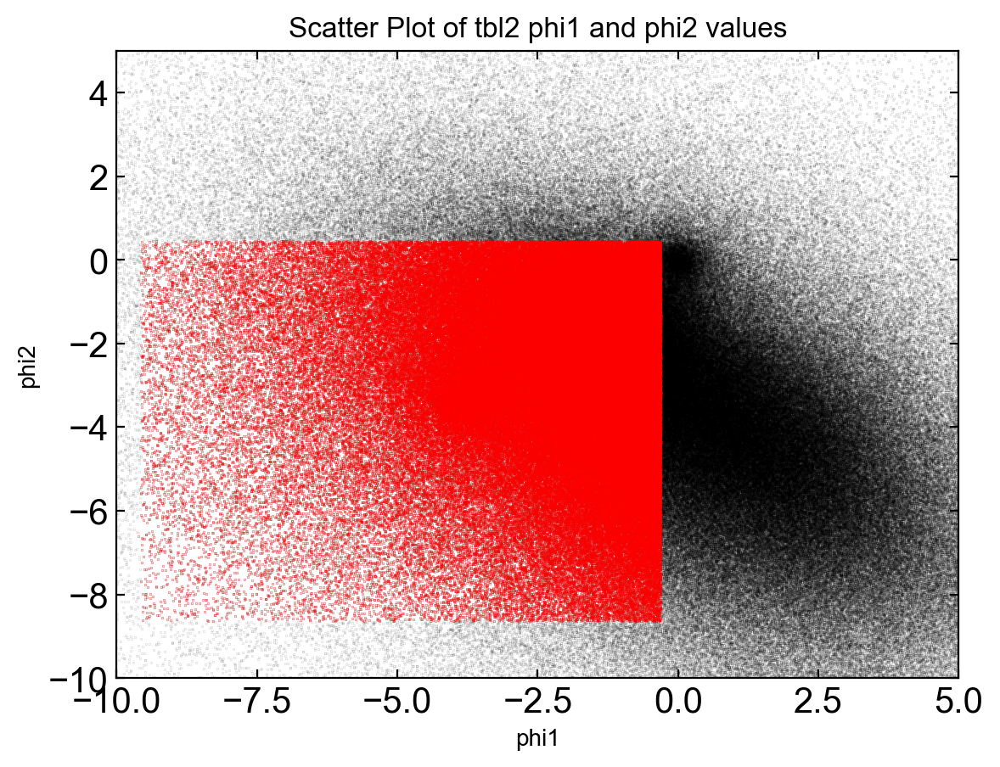

In [148]:
#### plt.figure(figsize=(8,8))
plt.scatter(subtbl[iso_mask]['pm_phi1_cosphi2_unrefl'], subtbl[iso_mask]['pm_phi2_unrefl'], s=0.001, c='black')
plt.scatter(subtbl[iso_mask&pm_mask]['pm_phi1_cosphi2_unrefl'], subtbl[iso_mask&pm_mask]['pm_phi2_unrefl'], s=0.01, c='r')
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.xlim(-10, 5) ; plt.ylim(-10,5)
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.show()

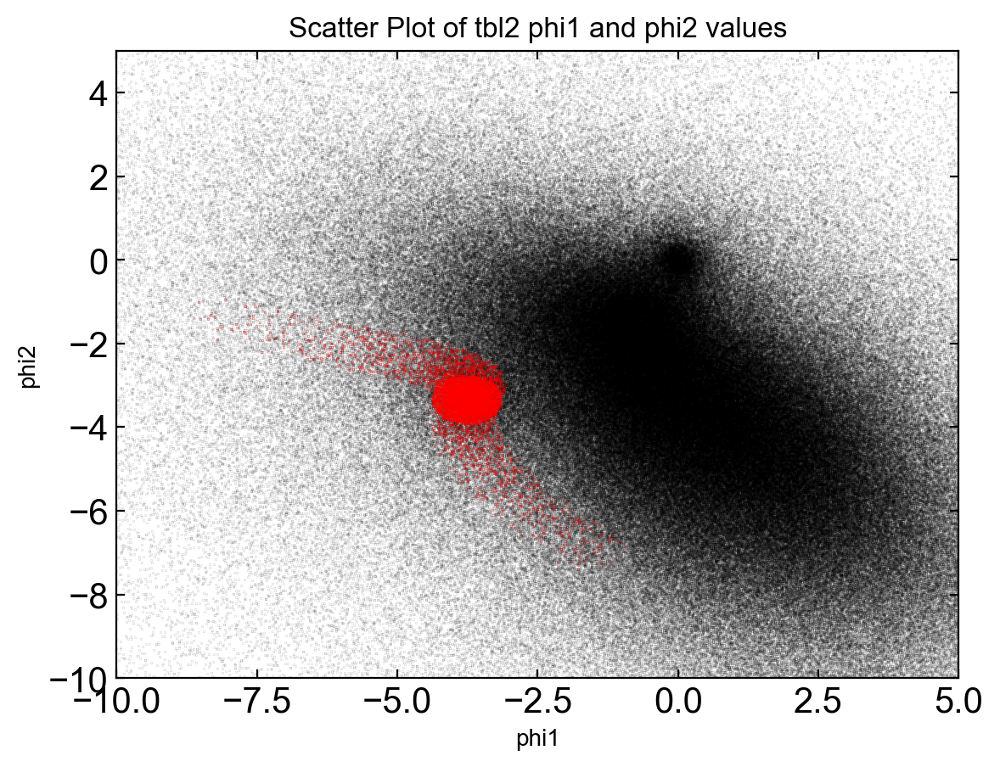

In [149]:
# plt.figure(figsize=(8,8))
plt.scatter(subtbl[iso_mask]['pm_phi1_cosphi2_unrefl'], subtbl[iso_mask]['pm_phi2_unrefl'], s=0.001, c='black')
plt.scatter(subtbl[iso_mask&pmsel.pm12_mask]['pm_phi1_cosphi2_unrefl'], subtbl[iso_mask&pmsel.pm12_mask]['pm_phi2_unrefl'], s=0.01, c='r')
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.xlim(-10, 5) ; plt.ylim(-10,5)
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.show()

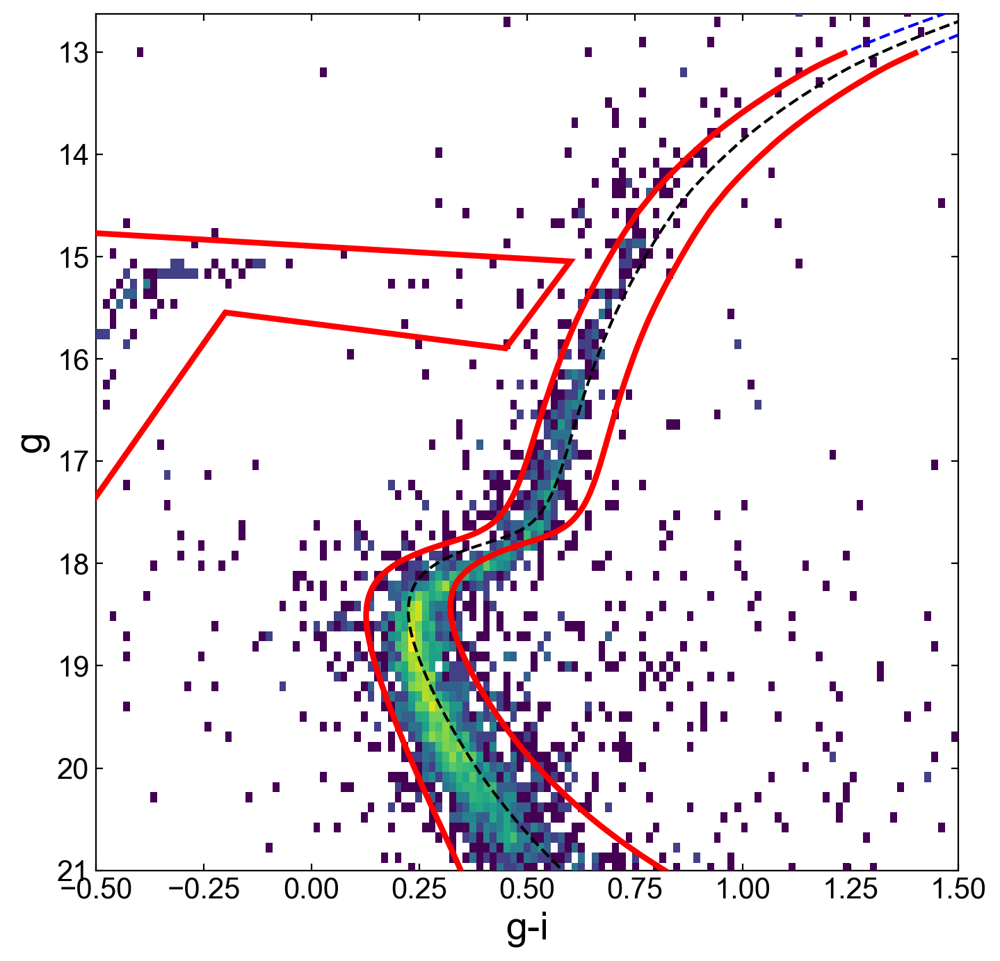

In [150]:
fig = o.plot_CMD()

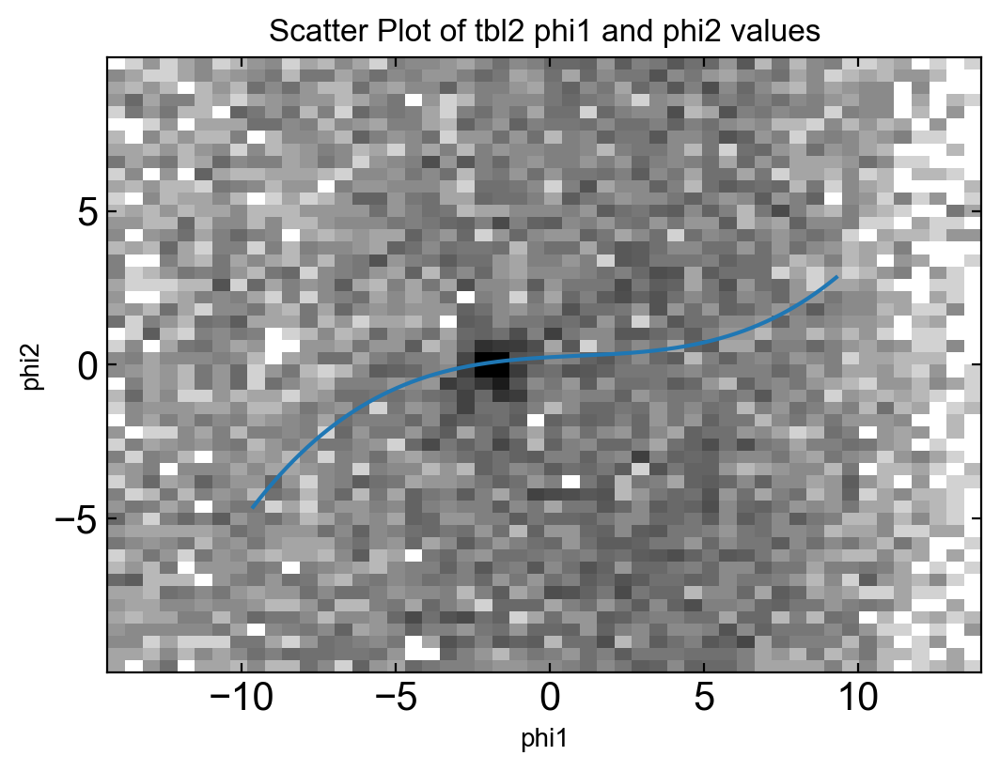

In [151]:
plt.figure(figsize=(6,6))
plt.hist2d(subtbl[pmsel.pm12_mask]['phi1'], subtbl[pmsel.pm12_mask]['phi2'], 
           bins=50, norm=mpl.colors.LogNorm(vmax=50), cmap='gray_r')
plt.plot(p.track.track.transform_to(p.stream_frame).phi1, p.track.track.transform_to(p.stream_frame).phi2)
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.gca().set_aspect('equal')
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.show()

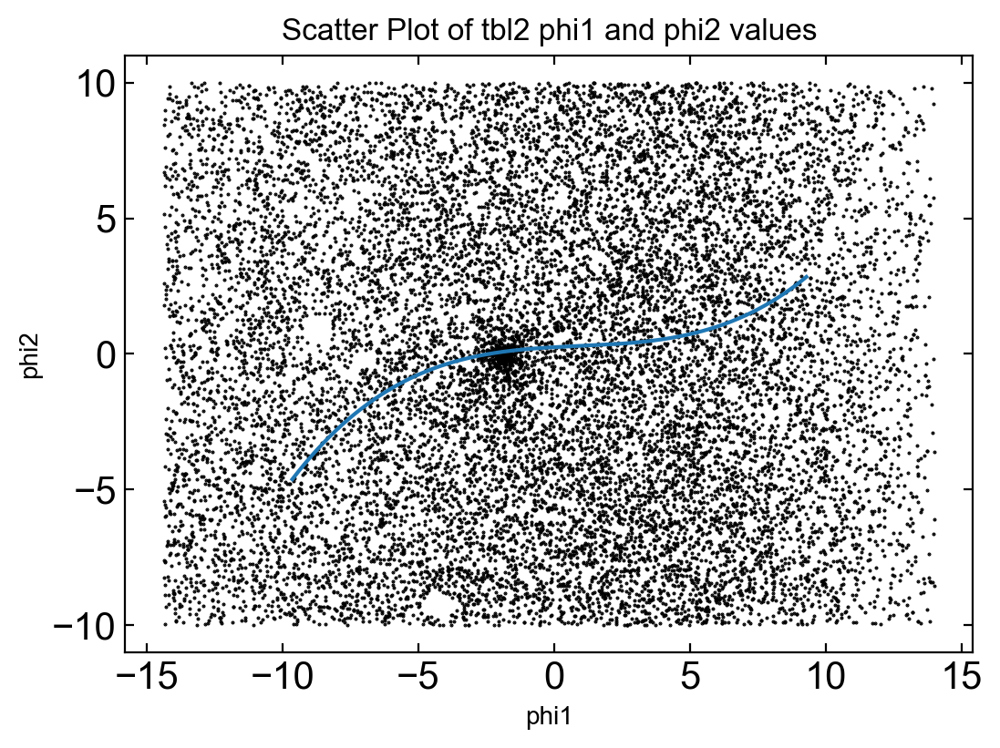

In [152]:
plt.figure(figsize=(6,6))
plt.scatter(subtbl[pmsel.pm12_mask]['phi1'], subtbl[pmsel.pm12_mask]['phi2'], 
           s=0.2, c='k')
plt.plot(p.track.track.transform_to(p.stream_frame).phi1, p.track.track.transform_to(p.stream_frame).phi2)
plt.xlabel('phi1')
plt.ylabel('phi2')
plt.gca().set_aspect('equal')
plt.title('Scatter Plot of tbl2 phi1 and phi2 values')
plt.show()

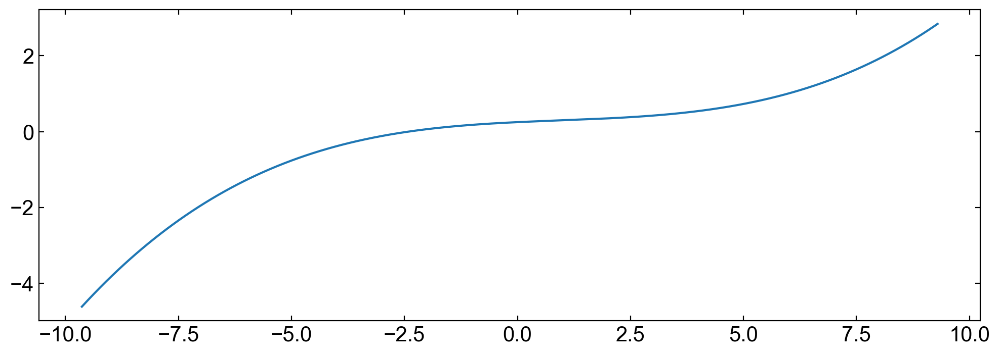

In [135]:
plt.figure(figsize=(12,4))
plt.plot(p.track.track.transform_to(p.stream_frame).phi1, p.track.track.transform_to(p.stream_frame).phi2)